In [10]:
from pathlib import Path
from typing import List, Optional

import hashlib

import numpy as np

import pandas as pd

import xarray as xr

import logging



def remove_empty_dirs(base_location: str | Path, dry_run: bool = True) -> None:
    """
    Recursively find and remove empty directories.
    
    Args:
        base_location: Base directory to start searching from
        dry_run: If True, only prints what would be removed without actual deletion
    """
    # Setup logging
    logging.basicConfig(level=logging.INFO,
                       format='%(asctime)s - %(levelname)s - %(message)s')
    
    base_path = Path(base_location) if isinstance(base_location, str) else base_location
    
    if not base_path.exists():
        logging.error(f"Directory {base_path} does not exist")
        return
    
    def is_dir_empty(path: Path) -> bool:
        """Check if directory is empty, ignoring .DS_Store files on Mac."""
        items = [item for item in path.iterdir() 
                if item.name != '.DS_Store']  # Mac-specific handling
        return len(items) == 0
    
    def remove_if_empty(path: Path) -> bool:
        """
        Remove directory if empty and return True if removed.
        For dry runs, just return whether it would be removed.
        """
        try:
            if is_dir_empty(path):
                if not dry_run:
                    if path.name == '.DS_Store':
                        path.unlink()  # Remove .DS_Store file
                    path.rmdir()  # Only removes if empty
                logging.info(f"{'Would remove' if dry_run else 'Removed'}: {path}")
                return True
            return False
        except PermissionError:
            logging.error(f"Permission denied: {path}")
            return False
        except Exception as e:
            logging.error(f"Error processing {path}: {e}")
            return False
    
    # Walk bottom-up through directory tree
    for path in sorted(base_path.rglob('*'), reverse=True):
        if path.is_dir():
            remove_if_empty(path)


def move_files_to_dir(fils: List, destination: Path):
    """Move list of files to desination directory."""
    assert isinstance(destination, Path)
    assert isinstance(fils, list)
    for f in fils:
        assert (isinstance(f, Path)) and f.is_file(), f"Problem with {f}"
        target_path = destination / f.name
        if target_path.is_file():
            print(f"The target is already a file!")
            continue
        else:
            f.rename(target_path)



def find_html_files(base_location):
    """Traverse directory tree to look for .html files."""
    # Convert string path to Path object if needed
    base_path = Path(base_location) if isinstance(base_location, str) else base_location
    
    # Use Path.glob to recursively find all .html files
    html_files = list(base_path.rglob("*.html"))
    
    return html_files


def find_netcdf_files(base_location: str | Path) -> List[Path]:
    """
    Recursively find all NetCDF files in a directory and its subdirectories.
    
    Args:
        base_location: Base directory to start searching from
        
    Returns:
        List of Path objects for all found NetCDF files
    """
    base_path = Path(base_location) if isinstance(base_location, str) else base_location
    
    try:
        # Look for both .nc and .nc4 files
        nc_files = list(base_path.rglob("*.nc"))
        nc4_files = list(base_path.rglob("*.nc4"))
        ncold_files = list(base_path.rglob("*.nc_old"))
        
        # Combine both lists
        netcdf_files = nc_files + nc4_files + ncold_files
        
        if not netcdf_files:
            print(f"No NetCDF files found in {base_path}")
        else:
            print(f"Found {len(netcdf_files)} NetCDF files")
            
        return netcdf_files
    
    except PermissionError:
        print(f"Permission denied accessing some paths in {base_path}")
        return []
    except Exception as e:
        print(f"Error scanning directory: {e}")
        return []


def find_files_by_string(base_location, srch):
    # Convert string path to Path object if needed
    base_path = Path(base_location) if isinstance(base_location, str) else base_location
    # Use Path.glob to recursively find all .html files
    files = list(base_path.rglob(f"*{srch}*"))
    return files


def calculate_netcdf_hash(filepath):
    try:
        with xr.open_dataset(filepath) as ds:  # Use xarray to open
            hasher = hashlib.sha256()
            for var_name in ds.variables:
                var = ds[var_name]
                if var.dtype.kind in ['S', 'U']: # Strings
                    data = "".join(var.values.flatten()).encode('utf-8')  # Encode to bytes for hashing
                else: # Other numeric types
                    data = var.values.tobytes() # Convert to bytes
                hasher.update(data)
            return hasher.hexdigest()
    except Exception as e:
        print(f"Error processing {filepath}: {e}")
        return None

def find_duplicates(data_dir, duplicate_dir):
    """Finds and moves duplicate netCDF files."""
    file_hashes = {}
    for filepath in data_dir.glob("*.nc"):  # Use pathlib's glob
        file_hash = calculate_netcdf_hash(filepath)

        if file_hash:
            if file_hash in file_hashes:
                print(f"Duplicate found: {filepath.name} (matches {file_hashes[file_hash]})")
                duplicate_path = duplicate_dir / filepath.name  # Use pathlib's path joining
                filepath.rename(duplicate_path)  # pathlib's rename (like shutil.move)
            else:
                file_hashes[file_hash] = filepath.name


In [2]:

goccp_version = "3.1.4"

goccp_variables = [
'SR_histo330m',
'3D_CloudFraction_OPAQ330m',
'3D_CloudFraction_Phase330m',
'3D_CloudFraction_Temp330m',
'3D_CloudFraction330m',
'Map_OPAQ330m',
'MapHigh330m',
'MapLowMidHigh_Phase330m',
'MapLowMidHigh330m',
'SR_histo_OPAQ330m',
'SR_histo_Phase330m',
]

time_periods = ["day", "night", "avg"]

file_specs = ["nc", "tmp", "tmp1", "nc_old", "other"]

#
# nco_fix_scalar_time copied from /Users/brianpm/Code/cam456_cloud_eval/fix_scalar_time
# The GOCCP files are a disaster, but I think all the problems might just be with
# their metadata specification.

# Going to separate files into:
# file-name-type:
# --> variable
#     --> day | night | avg

target_dir = Path("/Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/REORG3")

# Create the nested directory structure
for file_type in file_specs:
    file_type_dir = target_dir / file_type
    file_type_dir.mkdir(exist_ok=True)
    
    for variable in goccp_variables:
        variable_dir = file_type_dir / variable
        variable_dir.mkdir(exist_ok=True)
        
        for period in time_periods:
            period_dir = variable_dir / period
            period_dir.mkdir(exist_ok=True)



In [4]:
import re

# traverse all the directories and put files into new REORG3 structure:
loc = Path("/Volumes/Drudonna/GOCCP/GOCCP_V3.1.4")
dirs = [loc/"BAD_TIME", loc/"REORG", loc/"REORG2"]



# Regular expression to match file pattern and extract components
# Pattern: [goccp_variable]_YYYYMM_[time_period]_CFMIP2_sat_3.1.4[_tmp | _tmp1].nc
# file_pattern = re.compile(r'(.+?)_\d{6}_(day|night|avg)_CFMIP2_sat_3\.1\.4(?:_tmp1|_tmp)?\.nc$')
file_pattern = re.compile(r'(.+?)_\d{6}_(day|night|avg)_CFMIP2_sat_3\.1\.4(?:_tmp1|_tmp)?\.nc(?:_old)?$')

# Process all directories
for source_dir in dirs:
    if not source_dir.exists():
        print(f"Warning: Directory {source_dir} does not exist, skipping.")
        continue
        
    #  Walk through all files in the directory tree
    for root, dirs, files in source_dir.walk():
        for filename in files:
            path = root / filename
            
            # Match the file name pattern
            match = file_pattern.match(filename)
            if match:
                variable, time_period = match.groups()
                
                # Check if this variable is in our list
                if variable in goccp_variables:
                    # Determine file type
                    if "_tmp1" in filename:
                        file_type = "tmp1"
                    elif "_tmp" in filename:
                        file_type = "tmp"
                    elif filename.endswith(".nc"):
                        if "_old" in filename:
                            file_type = "nc_old"
                        else:
                            file_type = "nc"
                    else:
                        file_type = "other"
                    
                    # Build the target path
                    dest_path = target_dir / file_type / variable / time_period / filename
                    
                    # Create parent directories if they don't exist
                    dest_path.parent.mkdir(parents=True, exist_ok=True)
                    
                    # Move the file
                    try:
                        path.rename(dest_path)
                        print(f"Moved: {path} -> {dest_path}")
                    except OSError as e:
                        print(f"Error moving {path}: {e}")
                else:
                    print(f"Skipping file with unknown variable: {filename}")
            else:
                print(f"Skipping file that doesn't match pattern: {filename}")

Skipping file that doesn't match pattern: ._tmp
Skipping file that doesn't match pattern: ._tmp1
Skipping file that doesn't match pattern: ._nc_old
Skipping file that doesn't match pattern: Map_OPAQ330m_200801-201807_night_CFMIP2_sat_3.1.2.nc
Skipping file that doesn't match pattern: Map_OPAQ330m_200801-201812_night_CFMIP2_sat_3.1.2.nc
Skipping file that doesn't match pattern: Map_OPAQ330m_200801-202012_night_CFMIP2_sat_3.1.2.nc
Skipping file that doesn't match pattern: diff_tmp.nc
Moved: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/REORG/nc_old/3D_CloudFraction_OPAQ330m_200606_avg_CFMIP2_sat_3.1.4.nc_old -> /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/REORG3/other/3D_CloudFraction_OPAQ330m/avg/3D_CloudFraction_OPAQ330m_200606_avg_CFMIP2_sat_3.1.4.nc_old
Moved: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/REORG/nc_old/3D_CloudFraction_OPAQ330m_200606_day_CFMIP2_sat_3.1.4.nc_old -> /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/REORG3/other/3D_CloudFraction_OPAQ330m/day/3D_CloudFraction_OPAQ330m_200606_day_CFMIP2_sat_3.

In [8]:


# Then I'm going to go through to identify whether files need to have their time coordinate fixed;
# --> will duplicate full data into a "timefix" directory and fix in place using following function.
# Finally, will check the files for differences in data values. I don't think there are any.
#
#
import subprocess

def nco_fix_scalar_time(f, wd=None):
    if wd is None:
        cwd = Path.cwd()
    else:
        cwd = wd
    if isinstance(f, str):
        origfile = Path(f)
    else:
        origfile = f
    assert origfile.is_file(), "Input needs to be a file."
    # step 1: add a "new" variable that is time(time)
    tf1 = cwd / "tmpfile1.nc"
    cmd = ["ncap2", "-s", 'newtime[time]=time', str(origfile), str(tf1)]
    print(f"RUN: {' '.join(cmd)}")
    stdout = subprocess.run(cmd, check=True, capture_output=True, text=True).stdout
    print(stdout)
    assert tf1.is_file(), "FAIL AT tmpfile1.nc"
    # step 2: delete the incorret time variable
    tf2 = cwd / "tmpfile2.nc"
    subprocess.run(f"ncks -C -x -v time {str(tf1)} {str(tf2)}".split())
    assert tf2.is_file(), "FAIL AT tmpfile2.nc"
    # step 3: rename newtime to time
    tf3 = cwd / "tmpfile3.nc"
    subprocess.run(f"ncrename -v newtime,time {str(tf2)} {str(tf3)}".split())
    assert tf3.is_file(), "FAIL AT tmpfile3.nc"
    # step 4: rename tmpfile3.nc to the original file name and clean up 
    tf3.rename(origfile)
    tf1.unlink()
    tf2.unlink()
    print("Complete!")



In [9]:
base_dir = Path("/Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc")
# Counter for statistics
total_files = 0
fixed_files = 0
success_files = 0

# Process all directories under the nc directory
for root, dirs, files in base_dir.walk():
    for filename in files:
        if filename.endswith('.nc'):
            file_path = root / filename
            total_files += 1
            
            try:
                # Try to open the file with xarray
                with xr.open_dataset(file_path) as ds:
                    # If we get here, the file opened successfully
                    print(f"Success: {file_path}")
                    success_files += 1
            except ValueError as e:
                # If ValueError is raised, try to fix the file
                print(f"Error opening {file_path}: {e}")
                print(f"Attempting to fix {file_path}...")
                try:
                    nco_fix_scalar_time(file_path, wd=Path("/Volumes/Drudonna/GOCCP"))
                    fixed_files += 1
                    print(f"Fixed: {file_path}")
                    
                    # Verify the fix worked
                    try:
                        with xr.open_dataset(file_path) as ds:
                            print(f"Verification successful: {file_path}")
                    except Exception as verify_error:
                        print(f"Fix verification failed for {file_path}: {verify_error}")
                except Exception as fix_error:
                    print(f"Fix failed for {file_path}: {fix_error}")
            except Exception as other_error:
                # If other exceptions occur, just log them
                print(f"Unexpected error with {file_path}: {other_error}")

# Print summary statistics
print("\nProcessing complete!")
print(f"Total files processed: {total_files}")
print(f"Files successfully opened without fixes: {success_files}")
print(f"Files fixed: {fixed_files}")
print(f"Files with persistent issues: {total_files - success_files - fixed_files}")

Error opening /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/SR_histo330m/day/SR_histo330m_200801_day_CFMIP2_sat_3.1.4.nc: dimension 'time' already exists as a scalar variable
Attempting to fix /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/SR_histo330m/day/SR_histo330m_200801_day_CFMIP2_sat_3.1.4.nc...
RUN: ncap2 -s newtime[time]=time /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/SR_histo330m/day/SR_histo330m_200801_day_CFMIP2_sat_3.1.4.nc /Volumes/Drudonna/GOCCP/tmpfile1.nc

Complete!
Fixed: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/SR_histo330m/day/SR_histo330m_200801_day_CFMIP2_sat_3.1.4.nc
Verification successful: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/SR_histo330m/day/SR_histo330m_200801_day_CFMIP2_sat_3.1.4.nc
Unexpected error with /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/SR_histo330m/day/._SR_histo330m_200801_day_CFMIP2_sat_3.1.4.nc: [Errno 2] No such file or directory: '/Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/SR_histo330m/day/._SR_histo330m_20

In [11]:
# Now compare the "time corrected" files to the ones in either tmp or tmp1 (if they can be opened)
base_dir = Path("/Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc")
comp_dir = Path("/Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/REORG3/tmp")

# Function to get the matching file path in the comparison directory
def get_matching_file(base_file_path, base_dir, comp_dir):
    # Get the relative path from base_dir
    rel_path = base_file_path.relative_to(base_dir)
    
    # Construct the expected path in comp_dir
    # Replace .nc with _tmp.nc in the filename
    comp_file_name = rel_path.name.replace('.nc', '_tmp.nc')
    comp_file_path = comp_dir / rel_path.parent / comp_file_name
    
    return comp_file_path if comp_file_path.exists() else None

# Function to compare datasets
def compare_datasets(ds1, ds2):
    results = {}
    
    # Compare variables
    all_vars = set(list(ds1.data_vars) + list(ds2.data_vars))
    
    for var in all_vars:
        if var in ds1 and var in ds2:
            # Both datasets have this variable
            if ds1[var].shape == ds2[var].shape:
                # Check if arrays are equal
                try:
                    if np.array_equal(ds1[var].values, ds2[var].values, equal_nan=True):
                        results[var] = "Identical"
                    else:
                        # Calculate statistics for differences
                        diff = ds1[var].values - ds2[var].values
                        abs_diff = np.abs(diff)
                        
                        results[var] = {
                            "status": "Different",
                            "max_diff": np.nanmax(abs_diff) if not np.all(np.isnan(abs_diff)) else "All NaN",
                            "mean_diff": np.nanmean(abs_diff) if not np.all(np.isnan(abs_diff)) else "All NaN",
                            "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
                        }
                except Exception as e:
                    results[var] = f"Error comparing: {str(e)}"
            else:
                results[var] = f"Shape mismatch: {ds1[var].shape} vs {ds2[var].shape}"
        else:
            # Variable exists in only one dataset
            results[var] = "Only in original" if var in ds1 else "Only in comparison"
    
    return results

# Storage for results
comparison_results = []

# Walk through the base directory
for root, dirs, files in base_dir.walk():
    for filename in files:
        if filename.endswith('.nc'):
            base_file_path = root / filename
            comp_file_path = get_matching_file(base_file_path, base_dir, comp_dir)
            
            if comp_file_path:
                print(f"Comparing: {base_file_path.name} with {comp_file_path.name}")
                
                try:
                    # Open both datasets
                    with xr.open_dataset(base_file_path) as ds1, xr.open_dataset(comp_file_path) as ds2:
                        # Compare datasets
                        comparison = compare_datasets(ds1, ds2)
                        
                        # Store results
                        comparison_results.append({
                            "base_file": str(base_file_path),
                            "comp_file": str(comp_file_path),
                            "comparison": comparison
                        })
                        
                        # Print summary for this file pair
                        different_vars = [var for var, result in comparison.items() 
                                         if isinstance(result, dict) and result["status"] == "Different"]
                        
                        if different_vars:
                            print(f"  {len(different_vars)} variables with differences found")
                        else:
                            print("  All variables are identical")
                            
                except Exception as e:
                    print(f"  Error processing file pair: {e}")
                    comparison_results.append({
                        "base_file": str(base_file_path),
                        "comp_file": str(comp_file_path),
                        "error": str(e)
                    })
            else:
                print(f"No matching file found for: {base_file_path}")

# Create a summary report
summary = {
    "total_files_compared": len(comparison_results),
    "files_with_differences": sum(1 for result in comparison_results 
                                if "comparison" in result and 
                                any(isinstance(v, dict) and v.get("status") == "Different" 
                                    for v in result["comparison"].values())),
    "files_with_errors": sum(1 for result in comparison_results if "error" in result)
}

print("\nSummary:")
for key, value in summary.items():
    print(f"{key}: {value}")

# Save detailed results to a CSV file
results_path = Path.cwd() / "comparison_results.csv"
results_data = []


for result in comparison_results:
    if "comparison" in result:
        base_file = result["base_file"]
        comp_file = result["comp_file"]
        
        for var, comp in result["comparison"].items():
            if isinstance(comp, dict) and comp["status"] == "Different":
                results_data.append({
                    "base_file": base_file,
                    "comp_file": comp_file,
                    "variable": var,
                    "max_diff": comp["max_diff"],
                    "mean_diff": comp["mean_diff"],
                    "percent_diff": comp["percent_diff"]
                })

if results_data:
    df = pd.DataFrame(results_data)
    df.to_csv(results_path, index=False)
    print(f"\nDetailed comparison results saved to: {results_path}")

Comparing: SR_histo330m_200801_day_CFMIP2_sat_3.1.4.nc with SR_histo330m_200801_day_CFMIP2_sat_3.1.4_tmp.nc
  All variables are identical
Comparing: SR_histo330m_200802_day_CFMIP2_sat_3.1.4.nc with SR_histo330m_200802_day_CFMIP2_sat_3.1.4_tmp.nc
  All variables are identical
Comparing: SR_histo330m_200803_day_CFMIP2_sat_3.1.4.nc with SR_histo330m_200803_day_CFMIP2_sat_3.1.4_tmp.nc
  All variables are identical
Comparing: SR_histo330m_200804_day_CFMIP2_sat_3.1.4.nc with SR_histo330m_200804_day_CFMIP2_sat_3.1.4_tmp.nc
  All variables are identical
Comparing: SR_histo330m_200805_day_CFMIP2_sat_3.1.4.nc with SR_histo330m_200805_day_CFMIP2_sat_3.1.4_tmp.nc
  All variables are identical
Comparing: SR_histo330m_200806_day_CFMIP2_sat_3.1.4.nc with SR_histo330m_200806_day_CFMIP2_sat_3.1.4_tmp.nc
  All variables are identical
Comparing: SR_histo330m_200807_day_CFMIP2_sat_3.1.4.nc with SR_histo330m_200807_day_CFMIP2_sat_3.1.4_tmp.nc
  All variables are identical
Comparing: SR_histo330m_200808_day

/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_200801_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_200802_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_200802_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_200802_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_200803_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_200803_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_200803_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_200804_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_200804_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_200804_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_200805_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_200805_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_200805_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_200806_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_200806_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_200806_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_200807_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_200807_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_200807_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_200808_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_200808_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_200808_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_200809_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_200809_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_200809_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_200810_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_200810_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_200810_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_200811_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_200811_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_200811_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_200812_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_200812_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_200812_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_200901_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_200901_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_200901_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_200902_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_200902_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_200902_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_200903_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_200903_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_200903_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_200904_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_200904_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_200904_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_200905_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_200905_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_200905_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_200906_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_200906_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_200906_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_200907_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_200907_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_200907_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_200908_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_200908_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_200908_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_200909_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_200909_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_200909_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_200910_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_200910_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_200910_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_200911_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_200911_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_200911_avg_CFMIP2_sat_3.1.4.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


Comparing: 3D_CloudFraction_OPAQ330m_200912_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_200912_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_200912_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201001_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201001_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201001_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201002_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201002_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201002_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201003_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201003_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201003_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201004_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201004_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201004_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201005_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201005_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201005_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201006_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201006_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201006_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201007_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201007_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201007_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201008_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201008_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201008_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201009_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201009_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201009_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201010_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201010_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201010_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201011_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201011_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201011_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201012_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201012_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201012_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201101_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201101_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201101_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201102_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201102_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201102_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201103_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201103_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201103_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201104_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201104_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201104_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201105_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201105_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201105_avg_CFMIP2_sat_3.1.4.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


Comparing: 3D_CloudFraction_OPAQ330m_201106_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201106_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201106_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201107_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201107_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201107_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201108_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201108_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201108_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201109_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201109_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201109_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201110_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201110_avg_CFMIP2_sat_3.1.4

/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201110_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201111_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201111_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201111_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201112_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201112_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201112_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201201_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201201_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201201_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201202_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201202_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201202_avg_CFMIP2_sat_3.1.4.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


Comparing: 3D_CloudFraction_OPAQ330m_201203_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201203_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201203_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201204_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201204_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201204_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201205_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201205_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201205_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201206_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201206_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201206_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201207_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201207_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201207_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201208_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201208_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201208_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201209_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201209_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201209_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201210_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201210_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201210_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201211_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201211_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201211_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201212_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201212_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201212_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201301_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201301_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201301_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201302_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201302_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201302_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201303_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201303_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201303_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201304_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201304_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201304_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201305_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201305_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201305_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201306_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201306_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201306_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201307_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201307_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201307_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201308_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201308_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201308_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201309_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201309_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201309_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201310_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201310_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201310_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201311_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201311_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201311_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201312_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201312_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201312_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201401_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201401_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201401_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201402_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201402_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201402_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201403_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201403_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201403_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201404_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201404_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201404_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201405_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201405_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201405_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201406_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201406_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201406_avg_CFMIP2_sat_3.1.4.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


Comparing: 3D_CloudFraction_OPAQ330m_201407_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201407_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201407_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201408_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201408_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201408_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201409_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201409_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201409_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201410_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201410_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201410_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201411_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201411_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201411_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201412_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201412_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201412_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201501_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201501_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201501_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201502_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201502_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201502_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201503_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201503_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201503_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201504_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201504_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201504_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201505_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201505_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201505_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201506_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201506_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201506_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201507_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201507_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201507_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201508_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201508_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201508_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201509_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201509_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201509_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201510_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201510_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201510_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201511_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201511_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201511_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201512_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201512_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201512_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201601_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201601_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201601_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201603_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201603_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201603_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201604_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201604_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201604_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201605_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201605_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201605_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201606_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201606_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201606_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201607_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201607_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201607_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201608_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201608_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201608_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201609_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201609_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201609_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201610_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201610_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201610_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201611_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201611_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201611_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201612_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201612_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201612_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201701_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201701_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201701_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201702_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201702_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201702_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201703_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201703_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201703_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201704_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201704_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201704_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201705_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201705_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201705_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201706_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201706_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201706_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201707_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201707_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201707_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201708_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201708_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201708_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201709_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201709_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201709_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201710_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201710_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201710_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201711_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201711_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201711_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201712_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201712_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201712_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201801_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201801_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201801_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201802_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201802_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201802_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201803_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201803_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201803_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201804_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201804_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201804_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201805_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201805_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201805_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201806_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201806_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201806_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201807_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201807_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201807_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201808_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201808_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201808_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201809_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201809_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201809_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201810_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201810_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201810_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201811_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201811_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201811_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201812_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201812_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201812_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201901_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201901_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201901_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201902_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201902_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201902_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201903_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201903_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201903_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201904_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201904_avg_CFMIP2_sat_3.1.4_tmp.nc
  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201904_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201905_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201905_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201905_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201906_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201906_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201906_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201907_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201907_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201907_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201908_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201908_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201908_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201909_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201909_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201909_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201910_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201910_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201910_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201911_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201911_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201911_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_201912_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_201912_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_201912_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_202001_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_202001_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_202001_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_202002_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_202002_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_202002_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_202003_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_202003_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_202003_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_202004_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_202004_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_202004_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_202005_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_202005_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_202005_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_202006_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_202006_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_202006_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_202007_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_202007_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_202007_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_202008_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_202008_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_202008_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_202009_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_202009_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_202009_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_202010_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_202010_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_202010_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_202011_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_202011_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_202011_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_202012_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_202012_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_202012_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_202101_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_202101_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_202101_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_202102_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_202102_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_202102_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_202103_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_202103_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_202103_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_202104_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_202104_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_202104_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_202105_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_202105_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_202105_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_202106_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_202106_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_202106_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_202107_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_202107_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_202107_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_202108_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_202108_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_202108_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_202109_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_202109_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_202109_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_202110_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_202110_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_202110_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_202111_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_202111_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_202111_avg_CFMIP2_sat_3.1.4.nc
Comparing: 3D_CloudFraction_OPAQ330m_202112_avg_CFMIP2_sat_3.1.4.nc with 3D_CloudFraction_OPAQ330m_202112_avg_CFMIP2_sat_3.1.4_tmp.nc


/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  9 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_202112_avg_CFMIP2_sat_3.1.4.nc
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/3D_CloudFraction_OPAQ330m_200606_avg_CFMIP2_sat_3.1.4.nc
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_200606_avg_CFMIP2_sat_3.1.4.nc
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/3D_CloudFraction_OPAQ330m_200607_avg_CFMIP2_sat_3.1.4.nc
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/._3D_CloudFraction_OPAQ330m_200607_avg_CFMIP2_sat_3.1.4.nc
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/3D_CloudFraction_OPAQ330m/avg/3D_CloudFraction_OPAQ330m_200608_avg

/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_di

  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_200803_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_200804_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_200804_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_200804_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_200805_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_200805_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_200805_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_200806_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_200806_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m

/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_di

  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_200901_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_200902_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_200902_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_200902_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_200903_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_200903_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_200903_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_200904_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_200904_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m

/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_di

  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_200911_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_200912_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_200912_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_200912_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201001_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201001_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201001_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201002_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201002_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m

/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_di

  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201008_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201009_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201009_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201009_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201010_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201010_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201010_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201011_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201011_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m

/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_di

  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201106_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201107_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201107_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201107_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201108_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201108_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201108_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201109_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201109_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m

/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_di

  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201203_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201204_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201204_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201204_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201205_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201205_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201205_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201206_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201206_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m

/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_di

  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201212_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201301_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201301_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201301_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201302_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201302_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201302_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201303_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201303_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m

/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_di

  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201309_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201310_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201310_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201310_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201311_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201311_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201311_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201312_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201312_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m

/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_di

  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201407_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201408_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201408_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201408_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201409_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201409_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201409_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201410_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201410_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m

/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_di

  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201505_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201506_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201506_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201506_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201507_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201507_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201507_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201508_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201508_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m

/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_di

  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201603_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201604_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201604_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201604_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201605_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201605_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201605_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201606_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201606_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m

/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_di

Comparing: Map_OPAQ330m_201701_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201701_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201701_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201702_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201702_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201702_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201703_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201703_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201703_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201704_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201704_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found

/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_di

  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201710_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201711_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201711_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201711_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201712_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201712_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201712_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201801_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201801_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m

/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_di

  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201808_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201809_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201809_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201809_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201810_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201810_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201810_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201811_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201811_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m

/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_di

  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201906_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201907_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201907_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201907_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201908_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201908_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_201908_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_201909_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_201909_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m

/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_di

  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_202004_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_202005_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_202005_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_202005_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_202006_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_202006_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_202006_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_202007_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_202007_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m

/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_di

  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_202101_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_202102_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_202102_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_202102_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_202103_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_202103_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_202103_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_202104_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_202104_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m

/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_di

  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_202109_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_202110_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_202110_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_202110_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_202111_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_202111_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m_202111_avg_CFMIP2_sat_3.1.4.nc
Comparing: Map_OPAQ330m_202112_avg_CFMIP2_sat_3.1.4.nc with Map_OPAQ330m_202112_avg_CFMIP2_sat_3.1.4_tmp.nc
  14 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/Map_OPAQ330m/avg/._Map_OPAQ330m

/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: divide by zero encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: invalid value encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"
/var/folders/vr/glysjw691_d8n5wxl0vnzx7w0000gp/T/ipykernel_10066/1166516811.py:41: RuntimeWarning: overflow encountered in divide
  "percent_diff": np.nanmean(abs_diff / np.abs(ds2[var].values)) * 100 if not np.all(np.isnan(abs_diff)) else "All NaN"


  4 variables with differences found
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/SR_histo_OPAQ330m/day/SR_histo_OPAQ330m_200606_day_CFMIP2_sat_3.1.4.nc
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/SR_histo_OPAQ330m/day/SR_histo_OPAQ330m_200607_day_CFMIP2_sat_3.1.4.nc
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/SR_histo_OPAQ330m/day/SR_histo_OPAQ330m_200608_day_CFMIP2_sat_3.1.4.nc
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/SR_histo_OPAQ330m/day/SR_histo_OPAQ330m_200609_day_CFMIP2_sat_3.1.4.nc
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/SR_histo_OPAQ330m/day/SR_histo_OPAQ330m_200610_day_CFMIP2_sat_3.1.4.nc
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/SR_histo_OPAQ330m/day/SR_histo_OPAQ330m_200611_day_CFMIP2_sat_3.1.4.nc
No matching file found for: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/TIMEFIX/nc/SR_hi

In [12]:
# Based on this, I think the "TIMEFIX" nc files are good.
# Did a ncrcat on the MapLowMidHigh330m files: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/MapLowMidHigh330m_200606-202212_avg_CFMIP2_sat_3.1.4.nc
fds = xr.open_dataset("/Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/MapLowMidHigh330m_200606-202212_avg_CFMIP2_sat_3.1.4.nc")
fds

<xarray.Dataset> Size: 64MB
Dimensions:     (time: 196, latitude: 90, longitude: 180, toplvl: 3)
Coordinates:
  * latitude    (latitude) float32 360B -89.0 -87.0 -85.0 ... 85.0 87.0 89.0
  * longitude   (longitude) float32 720B -179.0 -177.0 -175.0 ... 177.0 179.0
  * time        (time) datetime64[ns] 2kB 2006-06-15 2006-07-15 ... 2022-12-15
  * toplvl      (toplvl) float32 12B 0.0 0.0 0.0
Data variables:
    clccalipso  (time, latitude, longitude) float32 13MB ...
    clhcalipso  (time, latitude, longitude) float32 13MB ...
    cllcalipso  (time, latitude, longitude) float32 13MB ...
    clmcalipso  (time, latitude, longitude) float32 13MB ...
    cltcalipso  (time, latitude, longitude) float32 13MB ...
Attributes:
    Description:         GOCCP_Map_Low_Mid_High_file
    Date:                2006-06-12T23-05-46ZD
    Version:             GOCCP v3.1.4
    Author:              Gregory CESANA, Helene CHEPFER, LMD/IPSL
    Scientific_contact:  helene.chepfer@lmd.polytechnique.fr
    Technical_support:   gregory.cesana@lmd.polytechnique.fr
    Creationdate:        20230306
    Website:             http://climserv.ipsl.polytechnique.fr/cfmip-obs.html
    References:          Chepfer et al, 2010, The GCM Oriented CALIPSO Cloud ...
    history:             Wed Feb 26 16:10:52 2025: ncrcat MapLowMidHigh330m_2...
    NCO:                 netCDF Operators version 5.3.1 (Homepage = http://nc...

In [15]:
monthly_climo = fds.groupby('time.month').mean(dim='time')
monthly_climo

<xarray.Dataset> Size: 4MB
Dimensions:     (month: 12, latitude: 90, longitude: 180, toplvl: 3)
Coordinates:
  * latitude    (latitude) float32 360B -89.0 -87.0 -85.0 ... 85.0 87.0 89.0
  * longitude   (longitude) float32 720B -179.0 -177.0 -175.0 ... 177.0 179.0
  * toplvl      (toplvl) float32 12B 0.0 0.0 0.0
  * month       (month) int64 96B 1 2 3 4 5 6 7 8 9 10 11 12
Data variables:
    clccalipso  (month, latitude, longitude) float32 778kB nan nan ... nan nan
    clhcalipso  (month, latitude, longitude) float32 778kB nan nan ... nan nan
    cllcalipso  (month, latitude, longitude) float32 778kB nan nan ... nan nan
    clmcalipso  (month, latitude, longitude) float32 778kB nan nan ... nan nan
    cltcalipso  (month, latitude, longitude) float32 778kB nan nan ... nan nan
Attributes:
    Description:         GOCCP_Map_Low_Mid_High_file
    Date:                2006-06-12T23-05-46ZD
    Version:             GOCCP v3.1.4
    Author:              Gregory CESANA, Helene CHEPFER, LMD/IPSL
    Scientific_contact:  helene.chepfer@lmd.polytechnique.fr
    Technical_support:   gregory.cesana@lmd.polytechnique.fr
    Creationdate:        20230306
    Website:             http://climserv.ipsl.polytechnique.fr/cfmip-obs.html
    References:          Chepfer et al, 2010, The GCM Oriented CALIPSO Cloud ...
    history:             Wed Feb 26 16:10:52 2025: ncrcat MapLowMidHigh330m_2...
    NCO:                 netCDF Operators version 5.3.1 (Homepage = http://nc...

In [25]:
np.arange(0.1, 1.0, 0.05)

array([0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 , 0.55, 0.6 ,
       0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95])

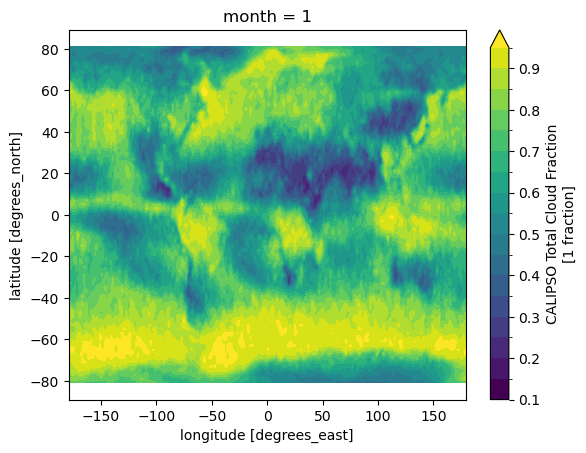

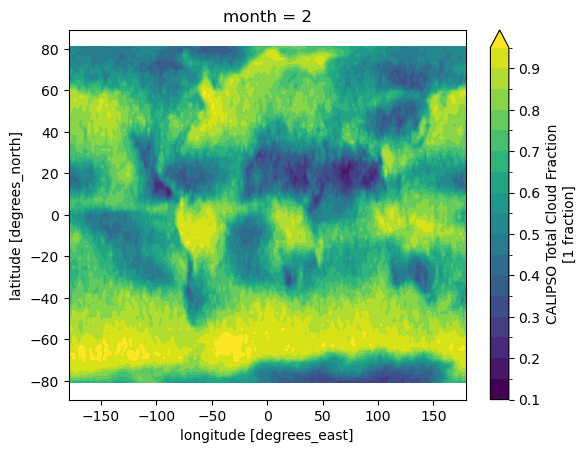

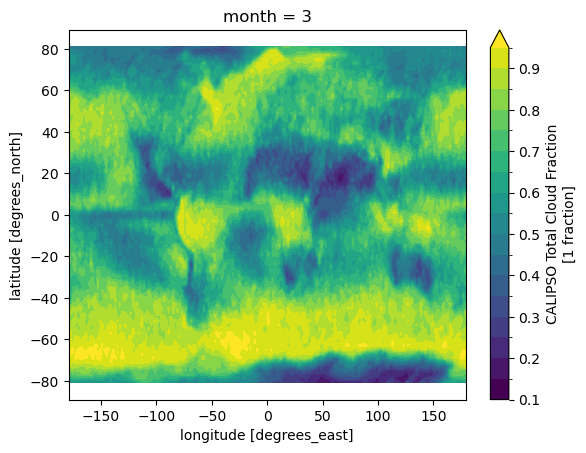

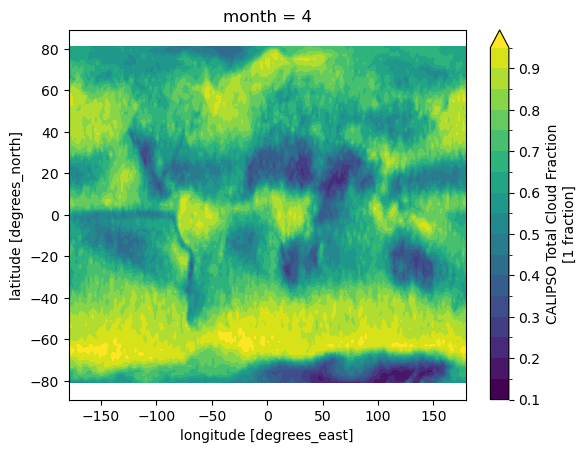

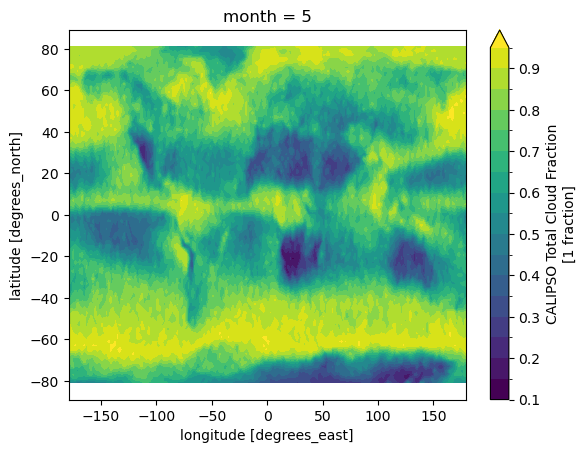

...

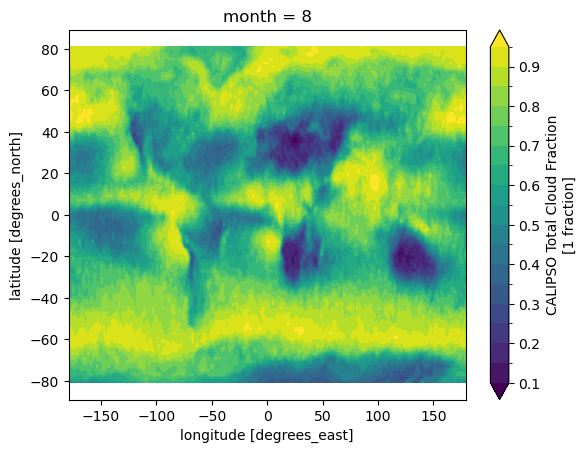

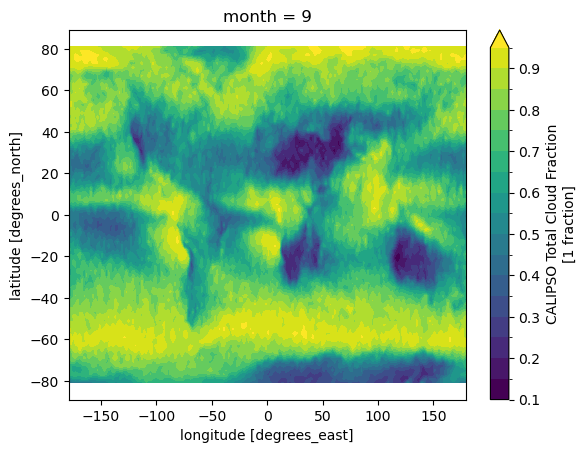

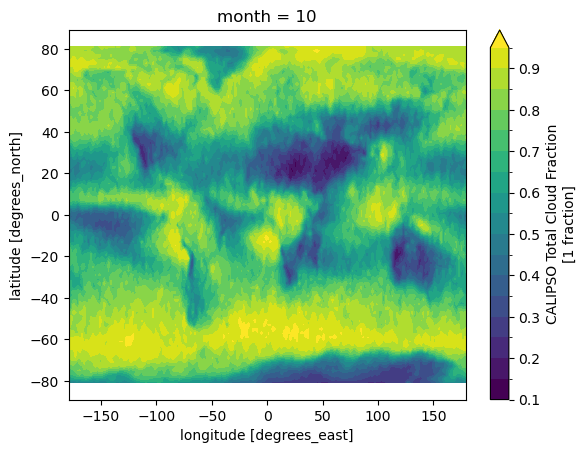

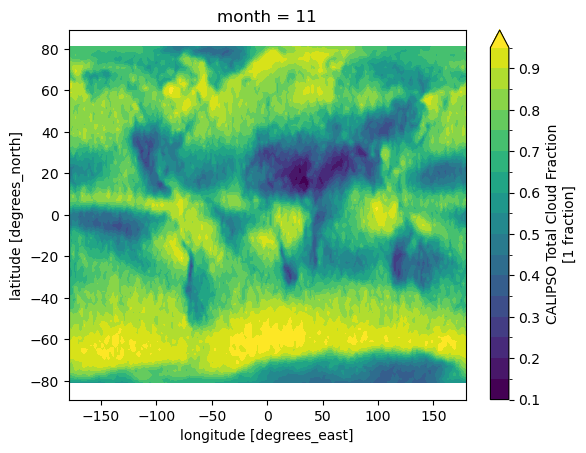

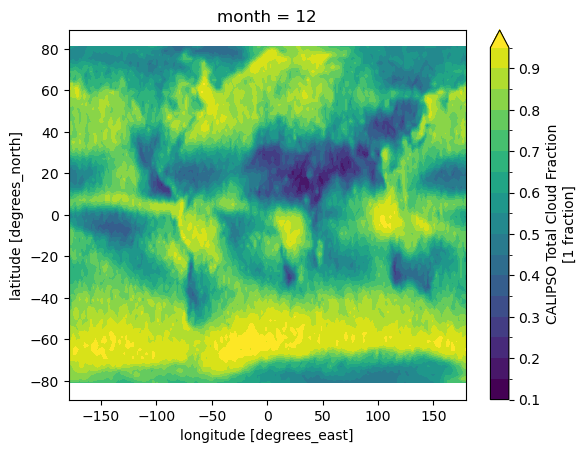

In [26]:
import matplotlib.pyplot as plt
levels = np.arange(0.1, 1.0, 0.05)
for m in range(1,13):
    monthly_climo['cltcalipso'].sel(month=m).plot.contourf(levels=levels)
    plt.show()

In [ ]:

# Used this to get away from the years as subdirs
def reorganize_directory(root_dir):
    """Reorganizes directory structure using pathlib."""

    root_path = Path(root_dir)

    for year_dir in root_path.iterdir():
        if year_dir.is_dir() and year_dir.name.isdigit() and len(year_dir.name) == 4:
            for data_type in year_dir.iterdir():
                if data_type.is_dir():
                    for sub_type in data_type.iterdir():
                        if sub_type.is_dir():
                            target_dir = root_path / data_type.name / sub_type.name
                            target_dir.mkdir(parents=True, exist_ok=True)  # Create if needed

                            for item in sub_type.iterdir():
                                target_path = target_dir / item.name
                                try:
                                    item.rename(target_path)  # Move using rename
                                    print(f"Moved {item} to {target_path}")
                                except Exception as e:
                                    print(f"Error moving {item}: {e}")

            try:
                year_dir.rmdir()  # Remove empty year dir
                print(f"Removed directory: {year_dir}")
            except OSError as e:
                print(f"Could not remove directory {year_dir}: {e}")




In [36]:

base_location = Path("/Volumes/Drudonna/GOCCP/GOCCP_V3.1.4")

files_to_remove = find_html_files(base_location)

# Print all found HTML files
# for file in files_to_remove:
#     print(file)

nc_files = find_netcdf_files(base_location)
print(f"found {len(nc_files)} nc files")


# Later, to remove the files:
# for file_path in files_to_remove:
#     file_path.unlink()  # pathlib's way to remove files

Found 13492 NetCDF files
found 13492 nc files


In [ ]:
nfiles = len(nc_files)
ufiles = len(set(nc_files))
if nfiles == ufiles:
    print(f"The files all have unique names, so can continue.")

The files all have unique names, so can continue.


In [ ]:

# Put all the nc files into REORG directory
move_files_to_dir(nc_files, base_location / "REORG")

# CAREFUL: 
# remove .html files
for f in files_to_remove:
    f.unlink()

The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target is already a file!
The target

In [ ]:

# addtional html files that have their names mangled
index_files = find_files_by_string(base_location, "index")
html_files = find_files_by_string(base_location, "html")
print(f"{len(index_files) = }, {len(html_files) = }")

# CAREFUL:
# remove presumbed html files
for f in index_files:
    f.unlink()


len(index_files) = 932, len(html_files) = 932


In [ ]:
# Find and remove shell scripts
shell_scripts = find_files_by_string(base_location, ".sh")
for f in shell_scripts:
    f.unlink()

In [ ]:
# Careful:
# Most of the directories will be empty now:
remove_empty_dirs(base_location, dry_run=False)

2025-02-22 12:15:05,521 - INFO - Removed: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/3D_CloudFraction/grid_2x2xL40/2021/night
2025-02-22 12:15:05,523 - INFO - Removed: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/3D_CloudFraction/grid_2x2xL40/2021/day
2025-02-22 12:15:05,524 - INFO - Removed: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/3D_CloudFraction/grid_2x2xL40/2021/avg
2025-02-22 12:15:05,525 - INFO - Removed: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/3D_CloudFraction/grid_2x2xL40/2021
2025-02-22 12:15:05,526 - INFO - Removed: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/3D_CloudFraction/grid_2x2xL40/2020/night
2025-02-22 12:15:05,528 - INFO - Removed: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/3D_CloudFraction/grid_2x2xL40/2020/day
2025-02-22 12:15:05,529 - INFO - Removed: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/3D_CloudFraction/grid_2x2xL40/2020/avg
2025-02-22 12:15:05,532 - INFO - Removed: /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/3D_CloudFraction/grid_2x2xL40/2020
2025-02-22 12:15:05,534 - INFO - Removed: /Volumes/Drudonna/

In [38]:
%%time
# Now we've got a directory full of nc files, but there are duplicates
# Let's see which ones are truly duplicates first... those can be moved away.
# Afterward we need to isolate what are the changes between tmp, tmp1, and nc_old versions

dups = find_duplicates(base_location / "REORG", base_location / "DUPES")


Error processing /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/REORG/MapHigh330m_200606_avg_CFMIP2_sat_3.1.4.nc: dimension 'time' already exists as a scalar variable
Error processing /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/REORG/MapHigh330m_200607_avg_CFMIP2_sat_3.1.4.nc: dimension 'time' already exists as a scalar variable
Error processing /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/REORG/MapHigh330m_200608_avg_CFMIP2_sat_3.1.4.nc: dimension 'time' already exists as a scalar variable
Error processing /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/REORG/MapHigh330m_200609_avg_CFMIP2_sat_3.1.4.nc: dimension 'time' already exists as a scalar variable
Error processing /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/REORG/MapHigh330m_200610_avg_CFMIP2_sat_3.1.4.nc: dimension 'time' already exists as a scalar variable
Error processing /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/REORG/MapHigh330m_200611_avg_CFMIP2_sat_3.1.4.nc: dimension 'time' already exists as a scalar variable
Error processing /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/REOR

In [100]:
# finding exact duplicates doesn't seem to work, so let's
# 1. identify the files that need to be compared:

def get_index(lst, srch):
    try:
        return lst.index(srch)
    except ValueError:
        return None  # Or return a default value, like -1


all_fils = sorted((base_location / "REORG").glob("*.nc"))
print(f"{len(all_fils) = }")

file_sets = {}
for f in all_fils:
    fn = f.stem
    p = fn.split("_")
    vindex = get_index(p, "3.1.4")
    if vindex is None:
        print(f"failed for file: {f.name} -> {p} ")
    else:
        basename = "_".join(p[:vindex+1])
        if basename in file_sets:
            file_sets[basename].append(f)
        else:
            file_sets[basename] = [f]


len(all_fils) = 8514
failed for file: Map_OPAQ330m_200801-201807_night_CFMIP2_sat_3.1.2.nc -> ['Map', 'OPAQ330m', '200801-201807', 'night', 'CFMIP2', 'sat', '3.1.2'] 
failed for file: Map_OPAQ330m_200801-201812_night_CFMIP2_sat_3.1.2.nc -> ['Map', 'OPAQ330m', '200801-201812', 'night', 'CFMIP2', 'sat', '3.1.2'] 
failed for file: Map_OPAQ330m_200801-202012_night_CFMIP2_sat_3.1.2.nc -> ['Map', 'OPAQ330m', '200801-202012', 'night', 'CFMIP2', 'sat', '3.1.2'] 
failed for file: diff_tmp.nc -> ['diff', 'tmp'] 


In [99]:
# top_lev = ["2D_Maps", "3D_CloudFraction", "SR_histo", "instant_SR_CR_DR"]
# sub_lev = []

to_check = 0
is_day = 0
is_night = 0
is_avg = 0
uniq_day = []
uniq_night = []
uniq_avg = []
for bn, fset in file_sets.items():
    if len(fset) > 1:
        to_check += 1
    else:
        p = fset[0].stem.split("_")
        if "avg" in p:
            is_avg += 1
            uniq_avg.append(fset[0])
            fset[0].rename( base_location / "REORG2" / "avg" / fset[0].name)
        elif "day" in p:
            is_day += 1
            uniq_day.append(fset[0])
            fset[0].rename( base_location / "REORG2" / "day" / fset[0].name)            
        elif "night" in p:
            is_night += 1
            uniq_night.append(fset[0])
            fset[0].rename( base_location / "REORG2" / "night" / fset[0].name)
        else:
            print(f"Not classified: {fset[0].name}")

print(f"{to_check = }, {is_day = }, {is_night = }, {is_avg = }")
# print(to_check)
# file_sets

to_check = 4088, is_day = 1, is_night = 0, is_avg = 0


In [86]:
def compare_data_vars(dses):
    """Compares data variables across a list of xarray Datasets."""

    if not dses:  # Handle empty list case
        return True  # Or False, depending on your desired behavior

    # Get the data variable names from the first dataset
    first_vars = set(dses[0].data_vars)

    # Compare with the remaining datasets
    for ds in dses[1:]:
        current_vars = set(ds.data_vars)
        if first_vars != current_vars:  # Check if they are exactly the same
            return False # Datasets are not the same
        
    return True # All datasets are the same

In [93]:
# Next - for every "set" of matching files, let's see if we can determine if the metadata and/or data is different
check_files = {}
check_same_datavars = {}
for bn, fset in file_sets.items():
    if len(fset) > 1:
        cf = [f.is_file() for f in fset]
        check_files[bn] = cf
        if not all(cf):
            print(f"issue with {bn}: {fset}")
        else:
            print(cf)
            dses = []
            for f in fset:
                try:
                    ds = xr.open_dataset(f)
                    dses.append(ds)
                except ValueError:
                    f.rename(base_location / "BAD_TIME" / f.name)
                    print(f"Bad Time: {f.name}")
                    continue
                except FileNotFoundError:
                    print(f"No file {f.name}")
                    continue
            if len(dses) > 1:
                are_same = compare_data_vars(dses)
                check_same_datavars[bn] = are_same


        
        

[True, True]
issue with 3D_CloudFraction330m_200801_day_CFMIP2_sat_3.1.4: [PosixPath('/Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/REORG/3D_CloudFraction330m_200801_day_CFMIP2_sat_3.1.4.nc'), PosixPath('/Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/REORG/3D_CloudFraction330m_200801_day_CFMIP2_sat_3.1.4_tmp.nc'), PosixPath('/Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/REORG/3D_CloudFraction330m_200801_day_CFMIP2_sat_3.1.4_tmp1.nc')]
[True, True, True]
Bad Time: 3D_CloudFraction330m_200801_night_CFMIP2_sat_3.1.4.nc
[True, True, True]
Bad Time: 3D_CloudFraction330m_200802_avg_CFMIP2_sat_3.1.4.nc
[True, True, True]
Bad Time: 3D_CloudFraction330m_200802_day_CFMIP2_sat_3.1.4.nc
[True, True, True]
Bad Time: 3D_CloudFraction330m_200802_night_CFMIP2_sat_3.1.4.nc
[True, True, True]
Bad Time: 3D_CloudFraction330m_200803_avg_CFMIP2_sat_3.1.4.nc
[True, True, True]
Bad Time: 3D_CloudFraction330m_200803_day_CFMIP2_sat_3.1.4.nc
[True, True, True]
Bad Time: 3D_CloudFraction330m_200803_night_CFMIP2_sat_3.1.4.nc
[True, True, Tru

In [ ]:
all(list(check_same_datavars.values()))
# Data vars always are the same. 

# I think _tmp.nc and _tmp1.nc must be to correct the time dimension before concatenation (?)
# _tmp.nc has time as UNLIMITED
        # float time(time) ;
        #         time:lon_name = "Time" ;
        #         time:units = "days since 2000-01-01 00:00:00" ;
        #         time:axis = "T" ;
        #         time:comment = "monthly means: date is set to the 15th of the month" ;
# Both tmp and tmp1 seem to be from ncra ... but maybe tmp1 is just derived from tmp with shell script instead of NCO


True

In [107]:
for bn, fs in file_sets.items():
    if len(fs) == 2:
        ds1 = xr.open_dataset(fs[0])
        ds2 = xr.open_dataset(fs[1])
        for v in ds1.data_vars:
            if v in ds2:
                try:
                    diff = ds1[v] - ds2[v]
                    print(f"{bn}[{v}]: {diff.min().item() = }, {diff.max().item() = }, close: {np.allclose(ds1[v].values, ds2[v].values)}")
                except:
                    print(f"failed for {bn}[{v}]")


3D_CloudFraction330m_200801_avg_CFMIP2_sat_3.1.4[alt_mid]: diff.min().item() = 0.0, diff.max().item() = 0.0, close: True
3D_CloudFraction330m_200801_avg_CFMIP2_sat_3.1.4[alt_bound]: diff.min().item() = 0.0, diff.max().item() = 0.0, close: True
3D_CloudFraction330m_200801_avg_CFMIP2_sat_3.1.4[clcalipso]: diff.min().item() = 0.0, diff.max().item() = 0.0, close: False
3D_CloudFraction330m_200801_avg_CFMIP2_sat_3.1.4[clrcalipso]: diff.min().item() = 0.0, diff.max().item() = 0.0, close: False
3D_CloudFraction330m_200801_avg_CFMIP2_sat_3.1.4[uncalipso]: diff.min().item() = 0.0, diff.max().item() = 0.0, close: False
3D_CloudFraction330m_200801_day_CFMIP2_sat_3.1.4[alt_mid]: diff.min().item() = 0.0, diff.max().item() = 0.0, close: True
3D_CloudFraction330m_200801_day_CFMIP2_sat_3.1.4[alt_bound]: diff.min().item() = 0.0, diff.max().item() = 0.0, close: True
3D_CloudFraction330m_200801_day_CFMIP2_sat_3.1.4[clcalipso]: diff.min().item() = 0.0, diff.max().item() = 0.0, close: False
3D_CloudFractio

In [ ]:
def find_nc_files(root_dir):
    """Reorganizes directory structure using pathlib."""

    root_path = Path(root_dir)

    for year_dir in root_path.iterdir():
        if year_dir.is_dir() and year_dir.name.isdigit() and len(year_dir.name) == 4:
            for data_type in year_dir.iterdir():
                if data_type.is_dir():
                    for sub_type in data_type.iterdir():
                        if sub_type.is_dir():
                            target_dir = root_path / data_type.name / sub_type.name
                            target_dir.mkdir(parents=True, exist_ok=True)  # Create if needed

                            for item in sub_type.iterdir():
                                target_path = target_dir / item.name
                                try:
                                    item.rename(target_path)  # Move using rename
                                    print(f"Moved {item} to {target_path}")
                                except Exception as e:
                                    print(f"Error moving {item}: {e}")

            try:
                year_dir.rmdir()  # Remove empty year dir
                print(f"Removed directory: {year_dir}")
            except OSError as e:
                print(f"Could not remove directory {year_dir}: {e}")


In [ ]:

# Example usage
root_directory = base_location / "2D_Maps" / "grid_2x2xL40"

reorganize_directory(root_directory)

Moved /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/2D_Maps/grid_2x2xL40/2006/avg/daily/index.html to /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/2D_Maps/grid_2x2xL40/avg/daily/index.html
Moved /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/2D_Maps/grid_2x2xL40/2006/day/daily/index.html to /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/2D_Maps/grid_2x2xL40/day/daily/index.html
Moved /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/2D_Maps/grid_2x2xL40/2006/night/daily/index.html to /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/2D_Maps/grid_2x2xL40/night/daily/index.html
Could not remove directory /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/2D_Maps/grid_2x2xL40/2006: [Errno 66] Directory not empty: '/Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/2D_Maps/grid_2x2xL40/2006'
Moved /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/2D_Maps/grid_2x2xL40/2007/avg/daily/index.html to /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/2D_Maps/grid_2x2xL40/avg/daily/index.html
Moved /Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/2D_Maps/grid_2x2xL40/2007/day/daily/index.html to /Volumes/Drudonna/GOCCP/GOC

In [78]:
from pathlib import Path
import numpy as np
import xarray as xr
import netCDF4

def fix_netcdf_time(filename):
    """
    Reads a netCDF file, converts the scalar 'time' variable to a time dimension/coordinate,
    and saves the corrected data to a new file with a '.fixed.nc' extension.

    Args:
        filename (str): Path to the input netCDF file.
    """
    if isinstance(filename, str):
        filename = Path(filename)
        assert filename.is_file(), "Not a file!"
    # Create the output filename
    filename_fixed = filename.parent / f"{filename.stem}.fixed.nc"

    # Open the input file
    with netCDF4.Dataset(filename, 'r') as src, \
         netCDF4.Dataset(filename_fixed, 'w') as dst:

        # Copy global attributes all at once via dictionary
        dst.setncatts(src.__dict__)

        # Get the 'time' variable data (assuming it's a scalar)
        time_data = src.variables['time'][:]

        # Check if time_data is scalar and convert to a list if necessary
        if not isinstance(time_data, (list, tuple, np.ndarray)):  # Import numpy as np if needed
            time_data = [time_data]
        elif isinstance(time_data, np.ma.MaskedArray) and time_data.ndim == 0:
            time_data = [time_data.item()]  # Extract the scalar value
        else:
            print(type(time_data))

        # Create the 'time' dimension
        dst.createDimension('time', len(time_data))

        # Create the 'time' variable as a dimension/coordinate
        time_var = dst.createVariable('time', src.variables['time'].datatype, ('time',))
        time_var[:] = time_data
        time_var.setncatts(src.variables['time'].__dict__)


        # Copy dimensions, but exclude 'time' if it exists
        for name, dimension in src.dimensions.items():
            print(f"{name = }, {dimension = }")
            if name != 'time':
                dst.createDimension(name, (len(dimension) if not dimension.isunlimited() else None))

        # Copy variables, but exclude 'time'
        for name, variable in src.variables.items():
            print(f"variable {name = }")
            if name != 'time':
                print(f"Checking: {variable.datatype = }, {variable.dimensions = }")
                x = dst.createVariable(name, variable.datatype, variable.dimensions)
                print("Made x for destination.")
                dst.variables[name][:] = src.variables[name][:]
                # copy variable attributes all at once via dictionary
                dst.variables[name].setncatts(src.variables[name].__dict__)

# if __name__ == "__main__":
#     # Get a list of all .nc files in the current directory
#     nc_files = [f for f in os.listdir('.') if f.endswith('.nc') and not f.endswith('.fixed.nc')]

#     # Process each file
#     for filename in nc_files:
#         print(f"Processing {filename}...")
#         fix_netcdf_time(filename)
#         print(f"Corrected file saved as {filename[:-3]}.fixed.nc")





In [79]:
fin = "/Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/REORG2/avg/MapLowMidHigh330m/tst.nc"
fix_netcdf_time(fin)

name = 'time', dimension = <class 'netCDF4._netCDF4.Dimension'> (unlimited): name = 'time', size = 1
name = 'latitude', dimension = <class 'netCDF4._netCDF4.Dimension'>: name = 'latitude', size = 90
name = 'longitude', dimension = <class 'netCDF4._netCDF4.Dimension'>: name = 'longitude', size = 180
name = 'toplvl', dimension = <class 'netCDF4._netCDF4.Dimension'>: name = 'toplvl', size = 3
variable name = 'time'
variable name = 'clccalipso'
Checking: variable.datatype = dtype('float32'), variable.dimensions = ('time', 'latitude', 'longitude')
Made x for destination.


AttributeError: NetCDF: Attempt to define fill value when data already exists.

In [ ]:


loc = Path("/Volumes/Drudonna/GOCCP/GOCCP_V3.1.4")


btloc = loc / "BAD_TIME"

fils = sorted(btloc.glob("MapLowMidHigh330m*_night_CFMIP2_sat_3.1.4.nc"))

try:
    ds1 = xr.open_dataset(fils[0], engine='netcdf4')   
except ValueError:
    print("Can not load file")
    dstmp = xr.open_dataset(loc / "REORG" / "tmp" / f"{fils[0].stem}_tmp.nc")
    dstmp1 = xr.open_dataset(loc / "REORG" / "tmp1" / f"{fils[0].stem}_tmp1.nc")
    print("alts loaded")


In [43]:
fils0 = sorted(Path("/Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/REORG2/avg/MapLowMidHigh330m").glob("MapLowMidHigh330m_20060*.nc"))

ncds = []
for f in fils0:
    # 1. Open with netCDF4 to get the variables directly
    with netCDF4.Dataset(f, "r") as ncfile:
        # 2. Get the time variable data
        time_data = ncfile.variables['time'][:]  # Get all time values
        time_var = ncfile.variables['time']

        # 3. Create a dictionary of variables, excluding the conflicting 'time'
        variables = {}
        for varname, var in ncfile.variables.items():
            if varname != 'time':
                variables[varname] = var

        # 4. Create the xarray Dataset.  Crucially, we create a time dimension manually.
        ds = xr.Dataset(variables, coords={'time': time_data})
        ds['time'].attrs['units'] = time_var.units
        if hasattr(time_var, 'calendar'):
            ds['time'].attrs['calendar'] = time_var.calendar
    
    # Now you should have the time dimension and your other variables.
    print(ds)   
    ncds.append(ds)        


ValueError: dimensions () must have the same length as the number of data dimensions, ndim=3

In [ ]:
f.parent


PosixPath('/Volumes/Drudonna/GOCCP/GOCCP_V3.1.4/REORG2/avg/MapLowMidHigh330m')